In [1]:
import sys

sys.path.append("..")

%load_ext autoreload
%autoreload complete

In [2]:
from math import ceil
from pathlib import Path
import concurrent.futures

import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import regionmask
import xarray as xr
import cmocean
import cf_xarray as cfxr

from lmrecon.io import open_mfdataset, IntakeESMLoader
from lmrecon.util import get_closest_gridpoint
from lmrecon.util import get_data_path
from lmrecon.plotting import plot_field, add_subplot_headers, format_plot
from lmrecon.stats import area_weighted_mean, rmse, average_seasonally
from lmrecon.logger import logging_disabled
from lmrecon.time import Season, use_tuple_time_coords

In [17]:
# ds = xr.open_zarr("/home/enkf6/dstiller/lmrecon/cmip6/MRI-ESM2-0/past1000/seasonal_anomalies.zarr").isel(time=slice(500*4)).compute()
# ds_trunc = open_mfdataset("/home/enkf6/dstiller/lmrecon/cmip6/MRI-ESM2-0/past1000/seasonal_anomalies-truncated-2024-11-26T15-17-45").isel(time=slice(500*4)).compute()
ds = xr.open_zarr("/home/enkf6/dstiller/lmrecon/cmip6/MPI-ESM1-2-LR/past2k/seasonal_anomalies.zarr").isel(time=slice(500*4)).compute()
ds_trunc = open_mfdataset("/home/enkf6/dstiller/lmrecon/cmip6/MPI-ESM1-2-LR/past2k/seasonal_anomalies-truncated-2024-11-26T15-17-45").isel(time=slice(500*4)).compute()
ds

<xarray.Dataset> Size: 1GB
Dimensions:  (time: 2000, lat: 90, lon: 180)
Coordinates:
  * lat      (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float64 1kB 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * time     (time) float64 16kB 1.292 1.542 1.792 2.042 ... 500.5 500.8 501.0
Data variables:
    cldhigh  (time, lat, lon) float32 130MB -0.09368 -0.09488 ... 0.04833
    cldlow   (time, lat, lon) float32 130MB 0.0 0.0 0.0 ... 0.04793 0.04917
    clwvi    (time, lat, lon) float32 130MB 0.0001329 0.0001253 ... 0.0002814
    eei      (time, lat, lon) float32 130MB -0.776 -0.788 ... 0.3604 0.4114
    ohc700   (time, lat, lon) float32 130MB nan nan nan ... 1.779e+09 1.825e+09
    rlut     (time, lat, lon) float32 130MB 1.059 1.071 1.09 ... -0.36 -0.4111
    rsdt     (time, lat, lon) float32 130MB 0.884 0.8845 0.8833 ... 0.0 0.0 0.0
    rsut     (time, lat, lon) float32 130MB 0.6011 0.6018 ... -0.0003531
    siconca  (time, lat, lon) float32 130MB 0.0 0.0 0.0 ... 0.00372 0.00372
    tas      (time, lat, lon) float32 130MB 0.5234 0.5195 ... -0.8947 -0.889
    tos      (time, lat, lon) float32 130MB nan nan nan ... -3.052e-05 0.0 0.0

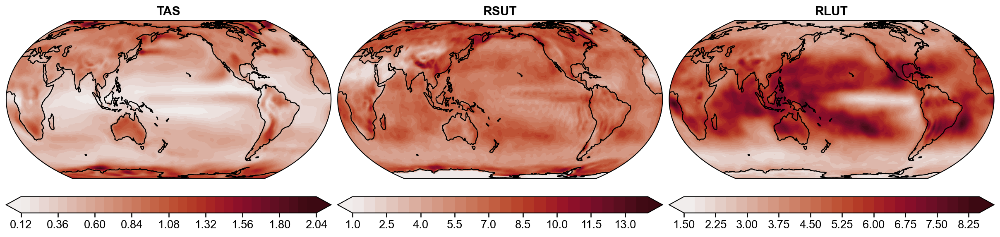

In [6]:
def plot_truncation_rmse():
    fig, axs = plt.subplots(1, 3, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(16, 6), dpi=150)
    plot_field(axs[0], rmse(ds["tas"], ds_trunc["tas"], "time"), cmap=cmocean.cm.amp, vmin=0, n_level=30)
    axs[0].set_title("TAS")
    plot_field(axs[1], rmse(ds["rsut"], ds_trunc["rsut"], "time"), cmap=cmocean.cm.amp, vmin=0, n_level=30)
    axs[1].set_title("RSUT")
    plot_field(axs[2], rmse(ds["rlut"], ds_trunc["rlut"], "time"), cmap=cmocean.cm.amp, vmin=0, n_level=30)
    axs[2].set_title("RLUT")

    for ax in axs:
        ax.coastlines()

plot_truncation_rmse()

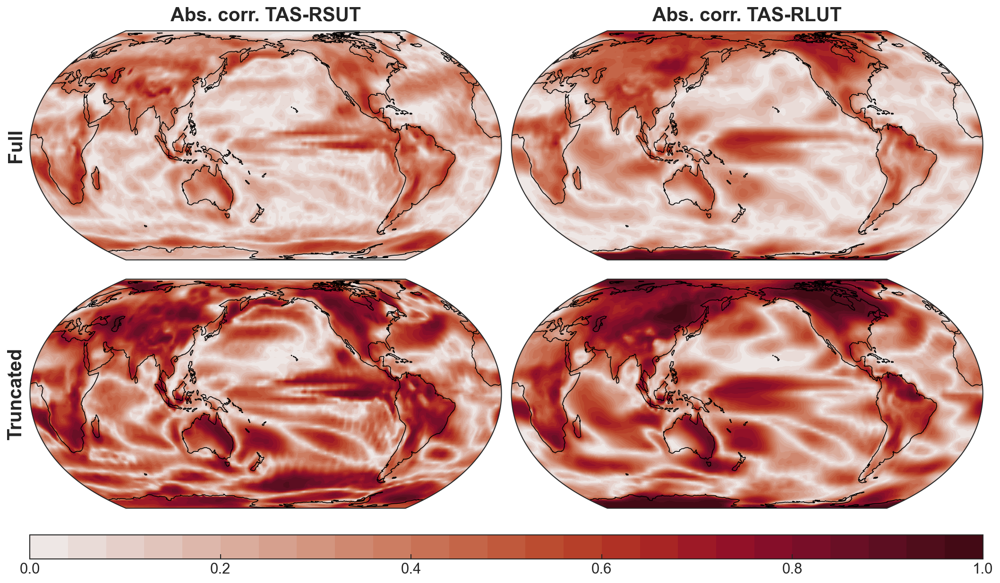

In [8]:
def plot_tas_rad_abscorrelation():
    fig, axs = plt.subplots(2, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=150)
    plot_field(axs.flatten(), [
        np.abs(xr.corr(ds["tas"], ds["rsut"], "time")),
        np.abs(xr.corr(ds["tas"], ds["rlut"], "time")),
        np.abs(xr.corr(ds_trunc["tas"], ds_trunc["rsut"], "time")),
        np.abs(xr.corr(ds_trunc["tas"], ds_trunc["rlut"], "time")),
    ], cmap=cmocean.cm.amp, cbar_aspect=40, vmin=0, vmax=1, n_level=30, extend="neither", cbar_ticks=[0, 0.2, 0.4, 0.6, 0.8, 1])

    add_subplot_headers(["Full", "Truncated"], ["Abs. corr. TAS-RSUT", "Abs. corr. TAS-RLUT"])

    for ax in axs.flatten():
        ax.coastlines()

    format_plot()

plot_tas_rad_abscorrelation()

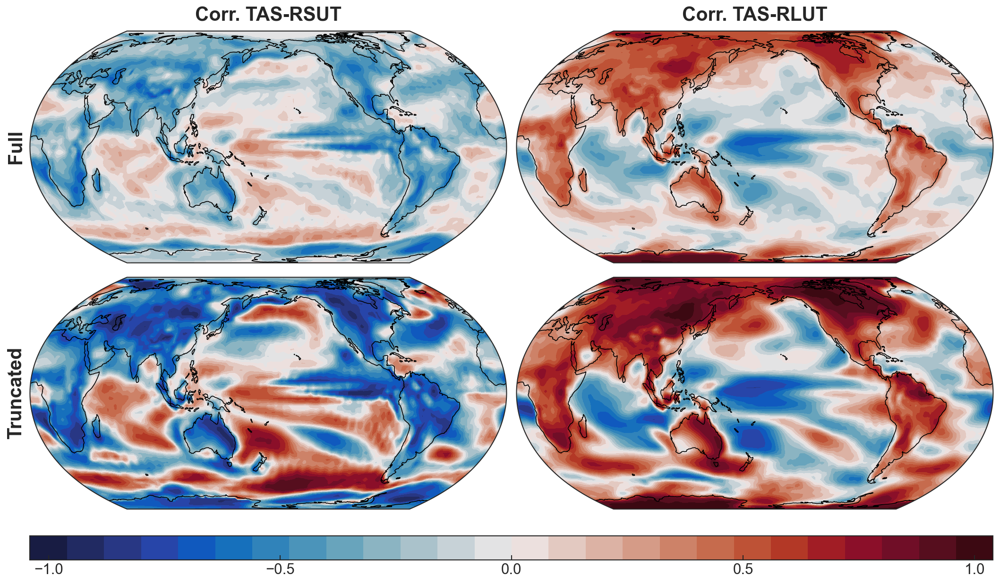

In [10]:
def plot_tas_rad_correlation():
    fig, axs = plt.subplots(2, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=150)
    plot_field(axs.flatten(), [
        xr.corr(ds["tas"], ds["rsut"], "time"),
        xr.corr(ds["tas"], ds["rlut"], "time"),
        xr.corr(ds_trunc["tas"], ds_trunc["rsut"], "time"),
        xr.corr(ds_trunc["tas"], ds_trunc["rlut"], "time"),
    ], cmap=cmocean.cm.balance, cbar_aspect=40, vmin=-1, vmax=1, n_level=30, extend="neither", cbar_ticks=[-1, -0.5, 0, 0.5, 1])

    add_subplot_headers(["Full", "Truncated"], ["Corr. TAS-RSUT", "Corr. TAS-RLUT"])

    for ax in axs.flatten():
        ax.coastlines()

    format_plot()

plot_tas_rad_correlation()

0.46646591247594466 0.5278230309767427
0.5425391926890258 0.6138380536329138
0.3765439562116143 0.911796750472508
0.5238728112696873 0.9658724245169874

0.29116759473277765 0.48815116032121747
0.3816396502373804 0.5641148513818044
0.447972950754823 0.9082042937995896
0.6298606068230164 0.9570803307237733

0.3038484170640446 0.4910786986958357
0.38382681961984927 0.5600012062872819
0.48176128103163235 0.86525510593678
0.6345775454842065 0.9253542530418283



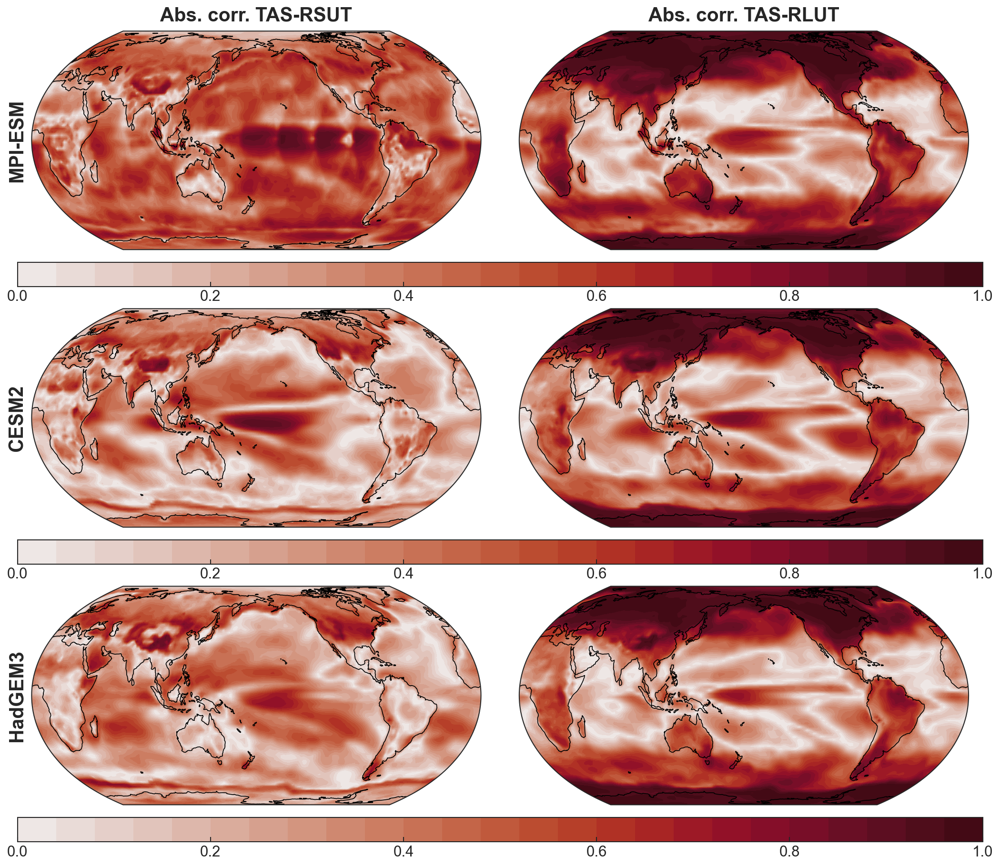

In [5]:
def plot_tas_rad_comparemodels(clearsky=False):
    fig, axs = plt.subplots(3, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 12), dpi=150)

    if clearsky:
        rlut = "rlutcs"
        rsut = "rsutcs"
    else:
        rlut = "rlut"
        rsut = "rsut"

    dss = [
        open_mfdataset("/home/enkf6/dstiller/lmrecon/cmip6/seasonal/anomalies/MPI-ESM1-2-LR/piControl").isel(time=slice(50*4)),
        open_mfdataset("/home/enkf6/dstiller/lmrecon/cmip6/seasonal/anomalies/CESM2/piControl").isel(time=slice(50*4)),
        open_mfdataset("/home/enkf6/dstiller/lmrecon/cmip6/seasonal/anomalies/HadGEM3-GC31-LL/piControl").isel(time=slice(50*4)),
    ]

    for ds in dss:
        ds_annual = ds.groupby(ds.time.astype(int)).mean()
        print(
            float(area_weighted_mean(np.abs(xr.corr(ds["tas"], ds[rsut], "time")))),
            float(area_weighted_mean(np.abs(xr.corr(ds["tas"], ds[rlut], "time")))))
        print(
            float(area_weighted_mean(np.abs(xr.corr(ds_annual["tas"], ds_annual[rsut], "time")))),
            float(area_weighted_mean(np.abs(xr.corr(ds_annual["tas"], ds_annual[rlut], "time")))))
        print(
            float(np.abs(xr.corr(area_weighted_mean(ds["tas"]), area_weighted_mean(ds[rsut]), "time"))),
            float(np.abs(xr.corr(area_weighted_mean(ds["tas"]), area_weighted_mean(ds[rlut]), "time"))))
        print(
            float(np.abs(xr.corr(area_weighted_mean(ds_annual["tas"]), area_weighted_mean(ds_annual[rsut]), "time"))),
            float(np.abs(xr.corr(area_weighted_mean(ds_annual["tas"]), area_weighted_mean(ds_annual[rlut]), "time"))))
        print()

    for i, ds in enumerate(dss):
        plot_field(axs[i, :], [
            np.abs(xr.corr(ds["tas"], ds[rsut], "time")),
            np.abs(xr.corr(ds["tas"], ds[rlut], "time")),
        ], cmap=cmocean.cm.amp, cbar_aspect=40, vmin=0, vmax=1, n_level=30, extend="neither", cbar_ticks=[0, 0.2, 0.4, 0.6, 0.8, 1])

    add_subplot_headers(
        ["MPI-ESM", "CESM2", "HadGEM3"],
        ["Abs. corr. TAS-RSUT", "Abs. corr. TAS-RLUT"])

    for ax in axs.flatten():
        ax.coastlines()

    format_plot()

plot_tas_rad_comparemodels(clearsky=True)

73.0 318.0


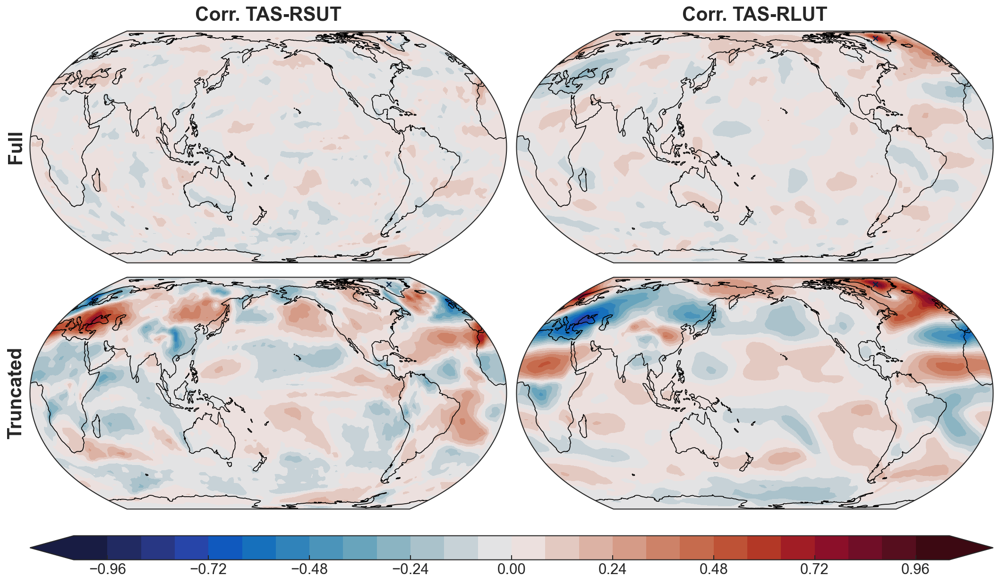

In [5]:
def plot_tas_rad_pointwise_correlation(lat, lon):
    lat, lon = get_closest_gridpoint(lat, lon, ds.lat.values, ds.lon.values)
    print(lat, lon)

    fig, axs = plt.subplots(2, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=150)
    plot_field(axs.flatten(), [
        xr.corr(ds["tas"].sel(lat=lat, lon=lon), ds["rsut"], "time"),
        xr.corr(ds["tas"].sel(lat=lat, lon=lon), ds["rlut"], "time"),
        xr.corr(ds_trunc["tas"].sel(lat=lat, lon=lon), ds_trunc["rsut"], "time"),
        xr.corr(ds_trunc["tas"].sel(lat=lat, lon=lon), ds_trunc["rlut"], "time"),
    ], cmap=cmocean.cm.balance, cbar_aspect=40, vmin=-1, vmax=1, n_level=30)

    add_subplot_headers(["Full", "Truncated"], ["Corr. TAS-RSUT", "Corr. TAS-RLUT"])

    for ax in axs.flat:
        ax.scatter(lon, lat, transform=ccrs.PlateCarree(), marker="x")
        ax.coastlines()

    format_plot()

plot_tas_rad_pointwise_correlation(0, 180)  # Tropical Pacific
# plot_tas_rad_pointwise_correlation(39.10, 360 - 94.58)  # Kansas City
# plot_tas_rad_pointwise_correlation(74, 360 - 42)  # Greenland

-1.0 180.0


39.0 266.0
73.0 318.0


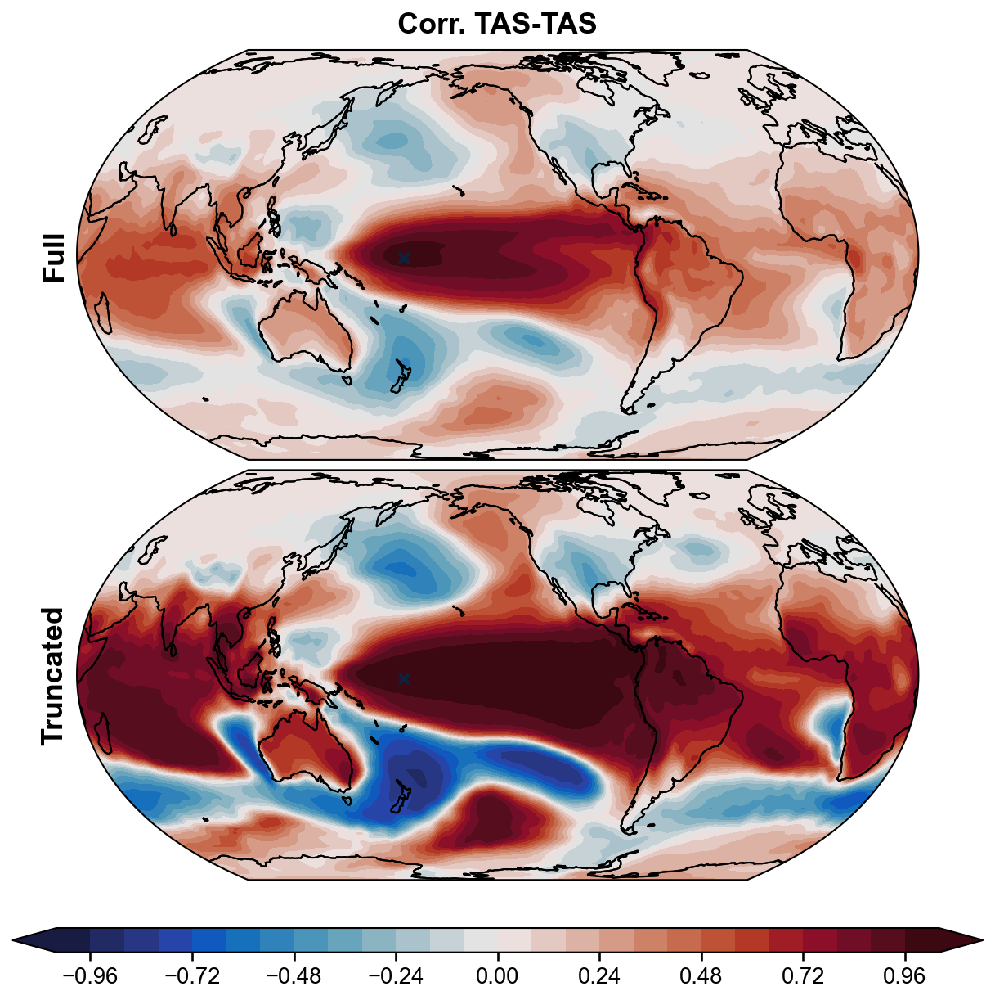

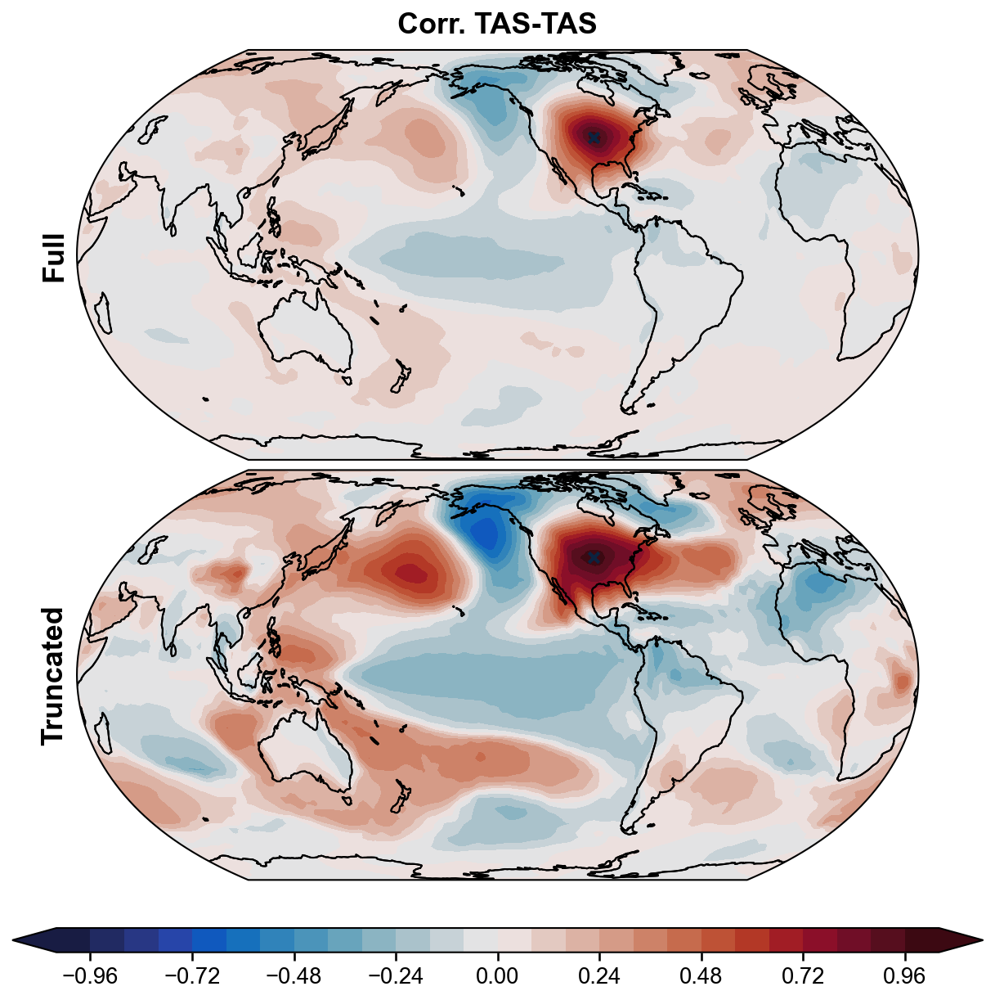

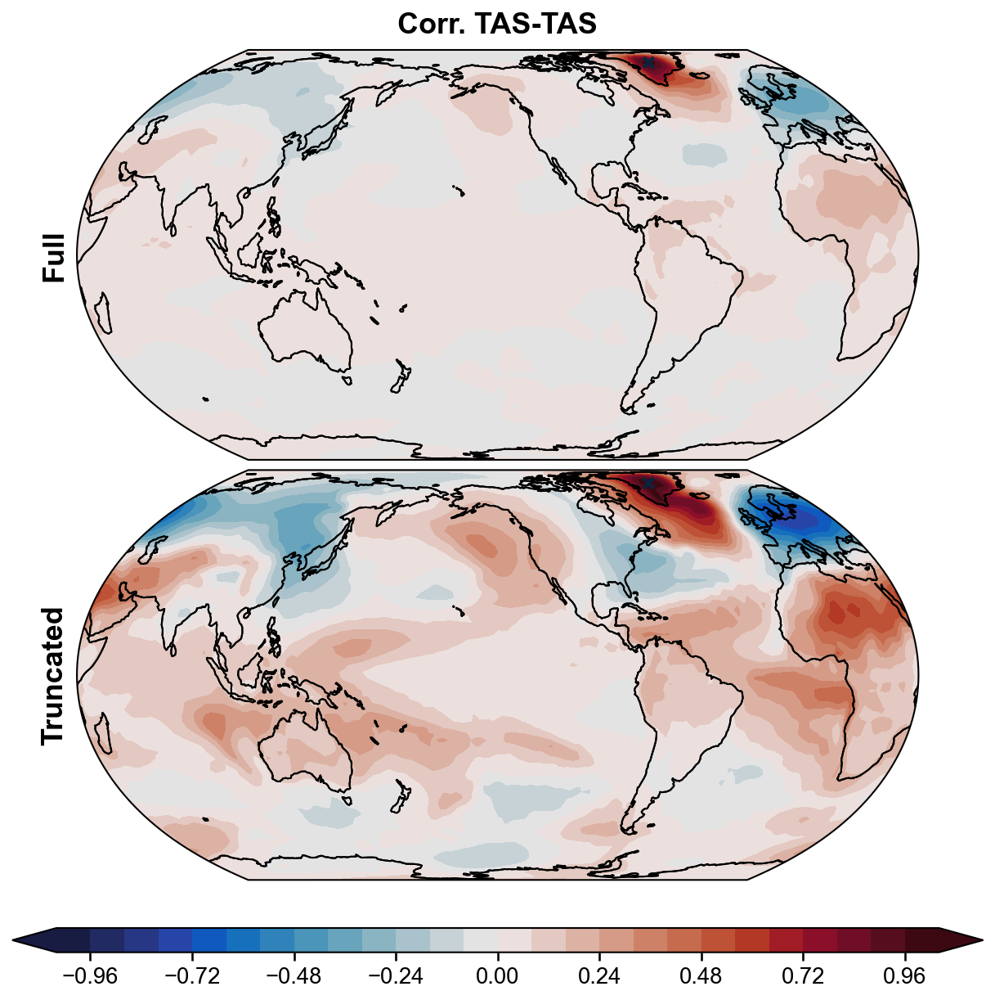

In [18]:
def plot_tas_tas_pointwise_correlation(lat, lon):
    lat, lon = get_closest_gridpoint(lat, lon, ds.lat.values, ds.lon.values)
    print(lat, lon)

    fig, axs = plt.subplots(2, 1, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=220)), figsize=(8, 8), dpi=150)
    plot_field(axs.flatten(), [
        xr.corr(ds["tas"].sel(lat=lat, lon=lon), ds["tas"], "time"),
        xr.corr(ds_trunc["tas"].sel(lat=lat, lon=lon), ds_trunc["tas"], "time"),
    ], cmap=cmocean.cm.balance, cbar_aspect=40, vmin=-1, vmax=1, n_level=30)

    add_subplot_headers(["Full", "Truncated"], ["Corr. TAS-TAS"])

    for ax in axs.flat:
        ax.scatter(lon, lat, transform=ccrs.PlateCarree(), marker="x")
        ax.coastlines()

    format_plot()

plot_tas_tas_pointwise_correlation(0, 180)  # Tropical Pacific
plot_tas_tas_pointwise_correlation(39.10, 360 - 94.58)  # Kansas City
plot_tas_tas_pointwise_correlation(74, 360 - 42)  # Greenland

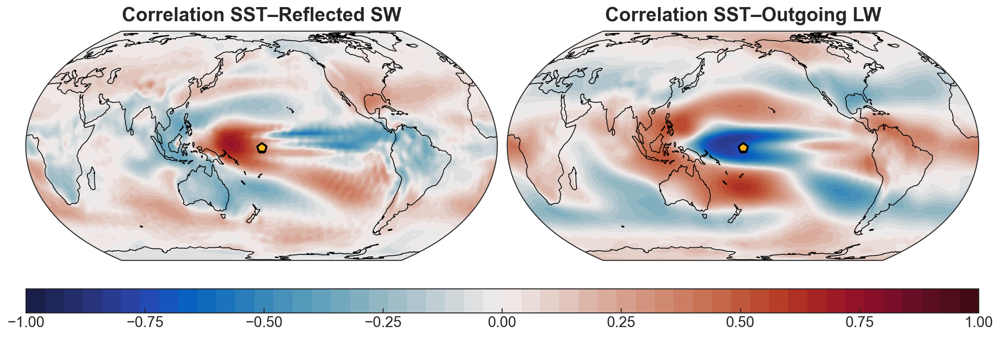

In [36]:
def plot_tas_rad_pointwise_correlation_presentation(lat, lon):
    lat, lon = get_closest_gridpoint(lat, lon, ds.lat.values, ds.lon.values)

    fig, axs = plt.subplots(1, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=150)
    plot_field(axs.flatten(), [
        xr.corr(ds["tos"].sel(lat=lat, lon=lon), ds["rsut"], "time"),
        xr.corr(ds["tos"].sel(lat=lat, lon=lon), ds["rlut"], "time"),
    ], cmap=cmocean.cm.balance, cbar_aspect=40, vmin=-1, vmax=1, n_level=50,
    extend="neither", cbar_ticks=np.arange(-1, 1.01, 0.25))

    add_subplot_headers(None, ["Correlation SST–Reflected SW", "Correlation SST–Outgoing LW"])

    for ax in axs.flat:
        ax.scatter(lon, lat, transform=ccrs.PlateCarree(), marker="p", c="C4", s=100, ec="black", lw=2)
        ax.coastlines()

    format_plot()

plot_tas_rad_pointwise_correlation_presentation(0, 180)  # Tropical Pacific
# plot_tas_rad_pointwise_correlation_presentation(39.10, 360 - 94.58)  # Kansas City
# plot_tas_rad_pointwise_correlation_presentation(74, 360 - 42)  # Greenland

In [ ]:
ds_past2k = xr.open_zarr("/home/enkf6/dstiller/lmrecon/cmip6/MPI-ESM1-2-LR/past2k/seasonal_anomalies.zarr")
ds_hist = xr.open_zarr("/home/enkf6/dstiller/lmrecon/cmip6/MPI-ESM1-2-LR/historical/seasonal_anomalies.zarr")

ds_past2k_ann = use_tuple_time_coords(ds_past2k).groupby("year").mean().rename(year="time")
ds_hist_ann = use_tuple_time_coords(ds_hist).groupby("year").mean().rename(year="time")

ds_past2k_dec = ds_past2k_ann.groupby(ds_past2k_ann.time // 10 * 100).mean()#.rename(year="time")
ds_hist_dec = ds_hist_ann.groupby(ds_hist_ann.time // 10 * 100).mean()#.rename(year="time")

Corr of global mean: RSUT = -0.40 RLUT = 0.68
Corr of global mean: RSUT = -0.50 RLUT = 0.72
Corr of global mean: RSUT = -0.71 RLUT = 0.85


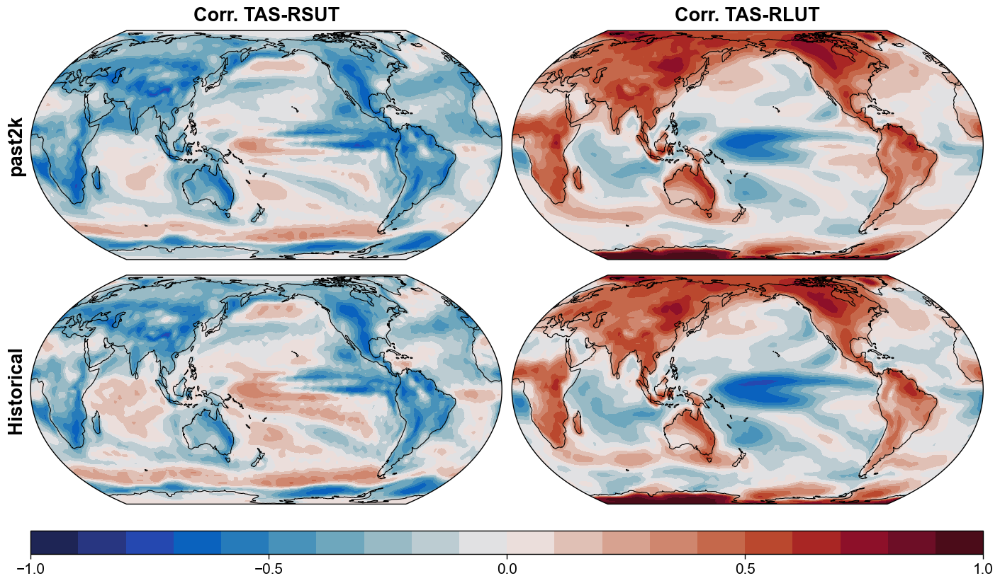

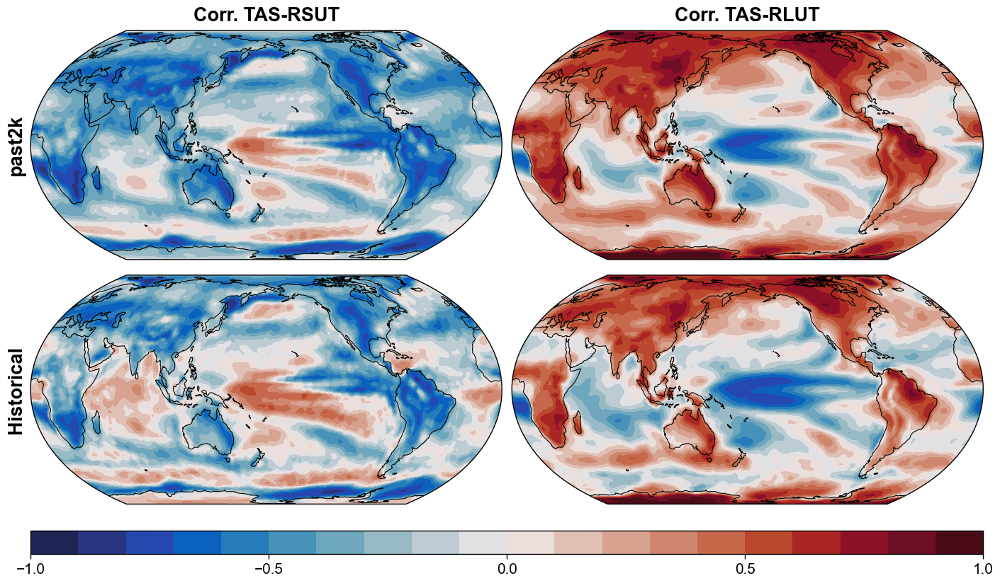

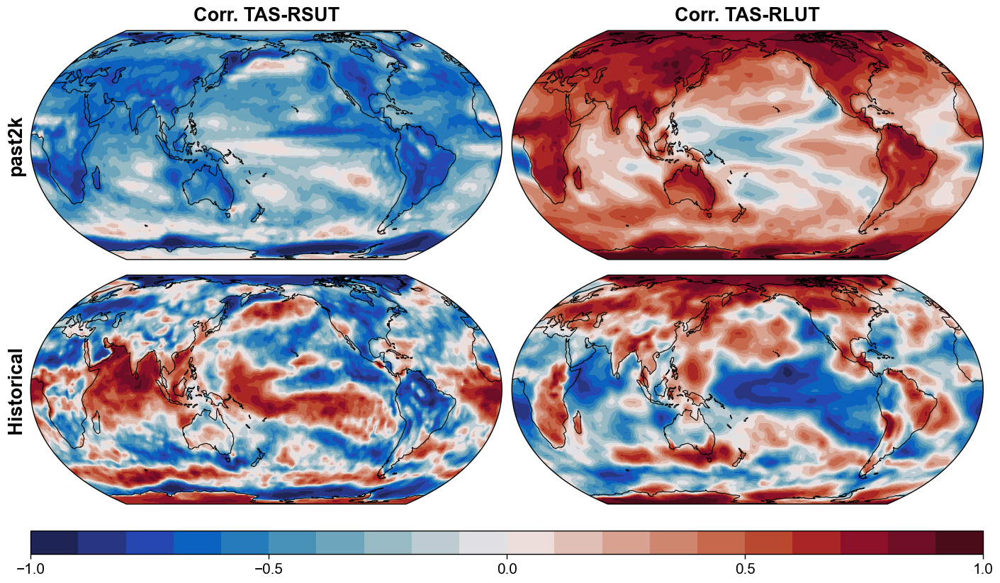

In [ ]:
def plot_tas_rad_correlation(ds1, ds2):
    fig, axs = plt.subplots(2, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=100)
    plot_field(axs.flatten(), [
        xr.corr(ds1["tas"], ds1["rsut"], "time"),
        xr.corr(ds1["tas"], ds1["rlut"], "time"),
        xr.corr(ds2["tas"], ds2["rsut"], "time"),
        xr.corr(ds2["tas"], ds2["rlut"], "time"),
    ], cmap=cmocean.cm.balance, cbar_aspect=40, vmin=-1, vmax=1, n_level=20, extend="neither", cbar_ticks=[-1, -0.5, 0, 0.5, 1])

    gm_rsut = xr.corr(area_weighted_mean(ds1["tas"]), area_weighted_mean(ds1["rsut"])).compute().item()
    gm_rlut = xr.corr(area_weighted_mean(ds1["tas"]), area_weighted_mean(ds1["rlut"])).compute().item()
    print(f"Corr of global mean: RSUT = {gm_rsut:.2f} RLUT = {gm_rlut:.2f}")

    add_subplot_headers(["past2k", "Historical"], ["Corr. TAS-RSUT", "Corr. TAS-RLUT"])

    for ax in axs.flatten():
        ax.coastlines()

    format_plot()

plot_tas_rad_correlation(ds_past2k, ds_hist)
plot_tas_rad_correlation(ds_past2k_ann, ds_hist_ann)
plot_tas_rad_correlation(ds_past2k_dec, ds_hist_dec)

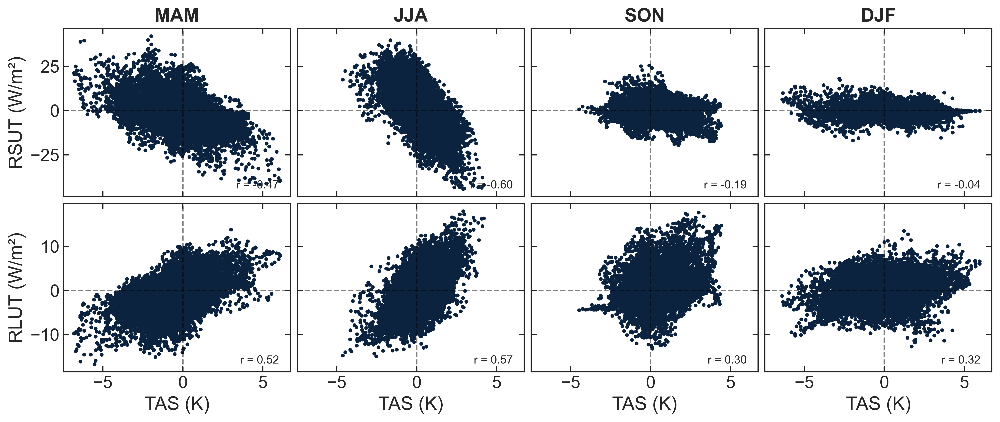

In [9]:
def plot_scatter(ds):
    fig, axs = plt.subplots(2, 4, sharey="row", sharex=True)

    for ax in axs.flatten():
        ax.axvline(0, ls="--", color="black", alpha=0.5)
        ax.axhline(0, ls="--", color="black", alpha=0.5)

    for i in range(0, 4):
        ds_ = ds.isel(time=slice(i, 10 * 4, 4))
        # ds_ = ds_.sel(lat=slice(-5, 5), lon=slice(160, 210))  # Nino3.4
        ds_ = ds_.sel(lat=slice(40, 70), lon=slice(0, 150))  # Eurasia
        # ds_ = ds_.sel(lat=slice(-60, -10), lon=slice(180, 280))  # Southern Ocean
        # ds_ = ds_.sel(lat=slice(41, 65), lon=slice(240, 290))  # North America

        axs[0, i].scatter(ds_["tas"], ds_["rsut"], rasterized=True, s=6)
        axs[0, i].text(s=f"r = {xr.corr(ds_['tas'], ds_['rsut']).item():.2f}",
                       transform=axs[0, i].transAxes, x=0.95, y=0.05,
                       horizontalalignment="right", fontsize=10)


        axs[1, i].scatter(ds_["tas"], ds_["rlut"], rasterized=True, s=6)
        axs[1, i].text(s=f"r = {xr.corr(ds_['tas'], ds_['rlut']).item():.2f}",
                       transform=axs[1, i].transAxes, x=0.95, y=0.05,
                       horizontalalignment="right", fontsize=10)
        axs[1, i].set_xlabel("TAS (K)")

        if i == 0:
            axs[0, i].set_ylabel("RSUT (W/m²)")
            axs[1, i].set_ylabel("RLUT (W/m²)")

    axs[0, 0].set_title("MAM")
    axs[0, 1].set_title("JJA")
    axs[0, 2].set_title("SON")
    axs[0, 3].set_title("DJF")
    format_plot()
    
plot_scatter(ds)

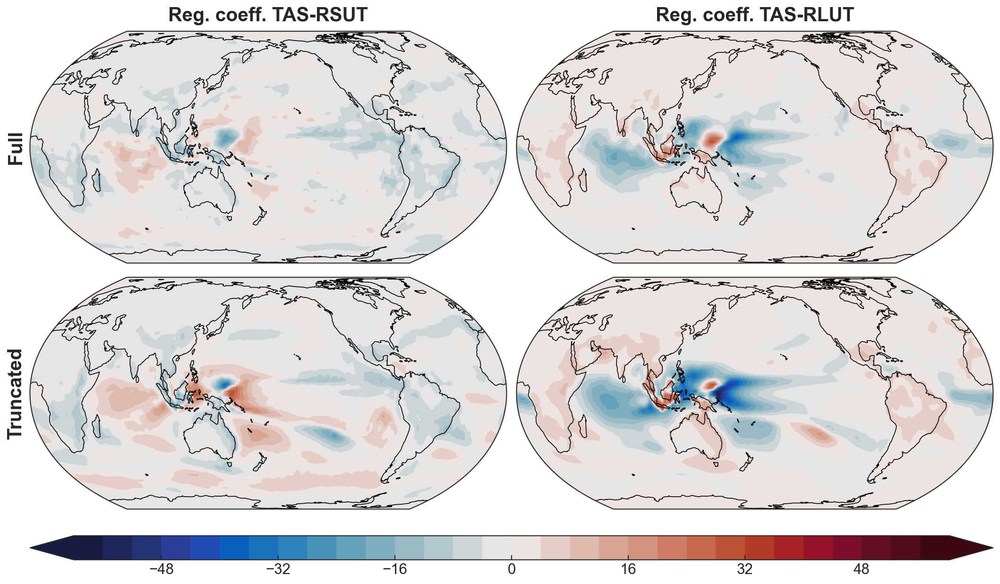

In [10]:
def plot_tas_rad_regcoeff():
    def get_reg_coeff(x, y):
        return xr.cov(x, y, "time") / xr.cov(x, x, "time")

    fig, axs = plt.subplots(2, 2, subplot_kw=dict(projection=ccrs.EqualEarth(central_longitude=180)), figsize=(14, 8), dpi=150)
    plot_field(axs.flatten(), [
        get_reg_coeff(ds["tas"], ds["rsut"]),
        get_reg_coeff(ds["tas"], ds["rlut"]),
        get_reg_coeff(ds_trunc["tas"], ds_trunc["rsut"]),
        get_reg_coeff(ds_trunc["tas"], ds_trunc["rlut"]),
    ], cmap=cmocean.cm.balance , cbar_aspect=40, n_level=30)

    add_subplot_headers(["Full", "Truncated"], ["Reg. coeff. TAS-RSUT", "Reg. coeff. TAS-RLUT"])

    for ax in axs.flatten():
        ax.coastlines()

    format_plot()

plot_tas_rad_regcoeff()